# Tradingview to vectorbt backtest analysis
We were struggling with some of our systems that were created in pinescript on the tradingview platform. We wanted to also backtest them in a different system like `vectorbt` and `backtesting.py` I created this notebook to receive csv files from tradingview with all of the trades from a system. Then download data from binance or other source and suck the trades into `vectorbt` to compare with a strategy built in `vectorbt` later I will do a similar example with `backtesting.py`

![TV Strategy Backtest View](images/tv_strategy_screenshot_1.jpg)
![TV Strategy Trades View](images/tv_strategy_screenshot_2.jpg)

Drop that csv into the `data` folder and import the trades into a vectorbt backtested portfolio. Note, you will also need to download data of the actual series you are running. eg. In this case I am using `ETHUSDT` 2 hour data from Binance and my start date is 2018-01-01. Once you run the trades through into a strategy and portfolio, you can see the following preview of the output.

![Strategy Output](images/strategy_results.png)


# Let's get started

In [180]:
import numpy as np
import vectorbt as vbt
import pandas as pd 
import datetime, pytz
from datetime import datetime, timedelta

# Set up some constants

In [178]:
start_date = datetime(2018, 1, 1, tzinfo=pytz.utc)  # time period for analysis, must be timezone-aware
# end_date = datetime.now(pytz.utc)
# end_date = datetime(2020, 1, 1, tzinfo=pytz.utc)
# The following is the number of days to look back for the analysis
# time_buffer = timedelta(days=100)  # buffer before to pre-calculate SMA/EMA, best to set to max window
vbt.settings.portfolio['init_cash'] = 100_000.  # 100,000$
vbt.settings.portfolio['fees'] = 0.00075  # 0.075% # These may already be incorporated into trade file 
# vbt.settings.portfolio['commission'] = 0.0025  # 0.25% May want to use this later
vbt.settings.array_wrapper['freq'] = '2h'  # frequency of data
vbt.settings.returns["year_freq"] = '365d'  # frequency of analysis


# Read in the Trade File from Tradingview Strategy
Note the file used in this example has some glitchy things which is why we are using it here. 
The file has several days where trades are done and canceled on the same candle, it also has a few trades that are done on the same candle but are canceled later.

In [3]:
# Download trade file from tradingview strategy as csv 

trade_file_2hr = "./data/Sample_tradingview_tradefile.csv"
df_trades_2hr = pd.read_csv(trade_file_2hr)


# Download Data to match the same raw price series that you were using in tradingview
The following cell we get binance data to match the tradingview data. Using the vectorbt function allows for you to update your data rather than re-downloading it. Use same frequency and ticker/exchange as what you used in your tradingview strategy for consistency

In [4]:
symbol = "ETHUSDT"
freq = '2h' # See here for the constants https://python-binance.readthedocs.io/en/latest/constants.html

# Get the data but first check if it is available in a file
try: 
    binance_data_2hr = vbt.DataUpdater.load("./data/BINANCE_ETHUSDT_2h.pickle")
    print("Loaded 2hr data from file")
except: 
    print("loading data from pickle failed going out to Binance to get data")
    # get data from binance first time can comment this out if you want to use the data from the csv
    binance_data_2hr = vbt.BinanceData.download(symbol, start=start_date, end="now UTC", interval='2h', show_progress=True) 
    print("Saving 2hr data to file")
    binance_data_2hr.save("./data/BINANCE_ETHUSDT_2h.pickle") # save data to file this is a pickle file 
    print("Saved 2hr data to file")
# Now set the dataframes to the underlying assets
df_data_2hr = binance_data_2hr.data["ETHUSDT"] # get the dataframe from the binance data object


Loaded 2hr data from file


In [5]:
# Check out the dataframe
df_data_2hr

,Open,High,Low,Close,Volume,Close time,Quote volume,Number of trades,Taker base volume,Taker quote volume
Open time,,,,,,,,,,
2018-01-01 00:00:00+00:00,733.01,734.52,716.80,717.97,4411.87186,2018-01-01 01:59:59.999000+00:00,3.204312e+06,5989,2310.56784,1.678657e+06
2018-01-01 02:00:00+00:00,717.67,737.99,717.59,734.50,4327.36175,2018-01-01 03:59:59.999000+00:00,3.146352e+06,6604,2275.46114,1.653412e+06
2018-01-01 04:00:00+00:00,734.99,750.00,730.01,748.99,4624.52971,2018-01-01 05:59:59.999000+00:00,3.436388e+06,7042,2712.00358,2.016683e+06
2018-01-01 06:00:00+00:00,748.91,763.55,746.21,751.99,4867.81763,2018-01-01 07:59:59.999000+00:00,3.672219e+06,6867,2576.52968,1.944414e+06
2018-01-01 08:00:00+00:00,751.77,758.10,737.40,753.21,4202.06918,2018-01-01 09:59:59.999000+00:00,3.146660e+06,5593,2051.95665,1.537156e+06
...,...,...,...,...,...,...,...,...,...,...
2022-03-20 12:00:00+00:00,2886.49,2899.18,2868.54,2873.39,54988.77370,2022-03-20 13:59:59.999000+00:00,1.585087e+08,97393,25593.94690,7.378985e+07
2022-03-20 14:00:00+00:00,2873.39,2885.85,2846.80,2853.93,55015.67510,2022-03-20 15:59:59.999000+00:00,1.576026e+08,108253,25955.86160,7.436271e+07
2022-03-20 16:00:00+00:00,2853.94,2878.00,2818.55,2826.57,47536.20880,2022-03-20 17:59:59.999000+00:00,1.353773e+08,66872,24277.88570,6.918017e+07


# If you ever need to resample the data
here is an example of how to resample the data to match the tradingview data if you end up using a different resolution. eg. 30minute data to 90 minute data.

In [6]:
# Create a dictionary to resample the columns from the 30min dataframe

binance_resample_dict={'Open':'first', 'High':'max', 'Low':'min', 'Close':'last', 'Volume':'sum', 'Close time':'last', 'Quote volume':'sum',
       'Number of trades':'sum', 'Taker base volume':'sum', 'Taker quote volume':'sum'}
df_data_30m = vbt.BinanceData.download(symbol, start= "3 days ago", end="now UTC", interval='30m', show_progress=True).data["ETHUSDT"]
# print(df_data_30m.head())
df_data_90m = df_data_30m.resample('90min').agg(binance_resample_dict) # resample to 90 min


2022-03-18 02:39:38.829000+00:00 - 2022-03-21 02:30:00+00:00: : 1it [00:00,  1.26it/s]


In [7]:
# Check it out to make sure everything is accurate
df_data_30m.head()

,Open,High,Low,Close,Volume,Close time,Quote volume,Number of trades,Taker base volume,Taker quote volume
Open time,,,,,,,,,,
2022-03-18 03:00:00+00:00,2782.42,2787.75,2777.33,2781.92,5253.3629,2022-03-18 03:29:59.999000+00:00,1.461700e+07,8793,2450.5296,6.817998e+06
2022-03-18 03:30:00+00:00,2781.92,2784.30,2770.60,2777.15,6201.4686,2022-03-18 03:59:59.999000+00:00,1.722396e+07,9106,3012.9951,8.368686e+06
2022-03-18 04:00:00+00:00,2777.15,2780.93,2770.26,2779.31,5588.0999,2022-03-18 04:29:59.999000+00:00,1.550826e+07,7631,2455.3274,6.814629e+06
2022-03-18 04:30:00+00:00,2779.31,2782.50,2777.17,2779.96,6405.8409,2022-03-18 04:59:59.999000+00:00,1.780982e+07,6844,3460.4025,9.620859e+06
2022-03-18 05:00:00+00:00,2779.97,2799.03,2779.96,2792.01,8874.8020,2022-03-18 05:29:59.999000+00:00,2.477417e+07,12640,4932.2471,1.376733e+07


In [8]:
df_data_90m.head()

,Open,High,Low,Close,Volume,Close time,Quote volume,Number of trades,Taker base volume,Taker quote volume
Open time,,,,,,,,,,
2022-03-18 03:00:00+00:00,2782.42,2787.75,2770.26,2779.31,17042.9314,2022-03-18 04:29:59.999000+00:00,4.734922e+07,25530,7918.8521,2.200131e+07
2022-03-18 04:30:00+00:00,2779.31,2806.94,2777.17,2801.82,22157.6613,2022-03-18 05:59:59.999000+00:00,6.182941e+07,28864,12600.9164,3.516724e+07
2022-03-18 06:00:00+00:00,2801.83,2810.11,2790.00,2791.80,20176.7686,2022-03-18 07:29:59.999000+00:00,5.651870e+07,26788,10857.0166,3.041716e+07
2022-03-18 07:30:00+00:00,2791.80,2814.99,2783.42,2800.83,31052.1814,2022-03-18 08:59:59.999000+00:00,8.692296e+07,48335,16514.2618,4.623203e+07
2022-03-18 09:00:00+00:00,2800.83,2807.75,2793.61,2807.03,21204.1966,2022-03-18 10:29:59.999000+00:00,5.938089e+07,28087,11115.9561,3.112672e+07


# Fix up the tradingview trade dataframe

In [9]:
df_data_2hr.loc["2018-1-1 16:00:00":"2019-01-01 00:00:00"]

,Open,High,Low,Close,Volume,Close time,Quote volume,Number of trades,Taker base volume,Taker quote volume
Open time,,,,,,,,,,
2018-01-01 16:00:00+00:00,748.27,748.91,733.00,737.02,4132.69139,2018-01-01 17:59:59.999000+00:00,3.067960e+06,5201,1872.47920,1.390508e+06
2018-01-01 18:00:00+00:00,737.01,749.98,734.00,746.23,3624.31223,2018-01-01 19:59:59.999000+00:00,2.692097e+06,6146,1902.96036,1.413822e+06
2018-01-01 20:00:00+00:00,746.23,762.62,744.39,759.28,3973.70321,2018-01-01 21:59:59.999000+00:00,3.004815e+06,5789,2044.07256,1.544959e+06
2018-01-01 22:00:00+00:00,759.00,760.99,750.46,754.99,3723.51592,2018-01-01 23:59:59.999000+00:00,2.813699e+06,5596,2016.93082,1.524716e+06
2018-01-02 00:00:00+00:00,754.99,870.00,749.06,854.29,11773.86018,2018-01-02 01:59:59.999000+00:00,9.406474e+06,15334,6228.43439,4.983330e+06
...,...,...,...,...,...,...,...,...,...,...
2018-12-31 16:00:00+00:00,135.30,136.40,133.52,134.92,36706.19624,2018-12-31 17:59:59.999000+00:00,4.947058e+06,11401,19840.27025,2.676125e+06
2018-12-31 18:00:00+00:00,134.92,135.23,128.70,131.03,58452.87863,2018-12-31 19:59:59.999000+00:00,7.681596e+06,18419,22193.01271,2.922583e+06
2018-12-31 20:00:00+00:00,131.03,131.67,129.79,130.21,45423.91514,2018-12-31 21:59:59.999000+00:00,5.937199e+06,13800,21899.88237,2.863035e+06


In [10]:
# Have a look at the trades dataframe
df_trades_2hr
# Note the date/time should be in UTC and the price should be the "Open" price from our dataframe above or very close to it. 

,Trade #,Type,Signal,Date/Time,Price,Contracts,Profit NONE,Profit %,Cum. Profit NONE,Cum. Profit %,Run-up NONE,Run-up %,Drawdown NONE,Drawdown %
0,1,Entry Short,ParSE,2018-01-01 16:00,748.27,80.1282,-1099.52,-1.83,-1099.52,-1.10,1211.57,2.02,1087.31,1.81
1,1,Exit Short,ParLE,2018-01-01 20:00,761.69,80.1282,-1099.52,-1.83,-1099.52,-1.10,1211.57,2.02,1087.31,1.81
2,2,Entry Long,ParLE,2018-01-01 20:00,761.69,78.8924,2970.12,4.94,1870.60,3.00,2982.74,4.96,1008.43,1.68
3,2,Exit Long,tpL,2018-01-02 00:00,799.65,78.8924,2970.12,4.94,1870.60,3.00,2982.74,4.96,1008.43,1.68
4,3,Entry Long,ParLE,2018-01-26 18:00,1061.31,57.5914,3031.32,4.96,4901.92,2.98,3044.15,4.98,1700.23,2.78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1255,628,Exit Long,tpL,2022-01-31 16:00,2686.34,645.9219,81955.25,4.96,1359610.40,5.95,82302.28,4.98,4225.42,0.26
1256,629,Entry Short,ParSE,2022-02-02 16:00,2663.90,328.7534,-882.99,-0.10,1358727.40,-0.06,28705.83,3.28,23549.52,2.69
1257,629,Exit Short,ParLE,2022-02-03 20:00,2665.52,328.7534,-882.99,-0.10,1358727.40,-0.06,28705.83,3.28,23549.52,2.69
1258,630,Entry Long,ParLE,2022-02-03 20:00,2665.52,333.3828,43975.59,4.95,1402703.00,3.01,44162.18,4.97,7582.16,0.85


## Note the closing trade above
Trade # 1 the exit trade at 2018-01-01 20:00:00 the price doesn't jive with the price of the candle in the data dataframe. For this, our backtests will be slightly off. 

One possible solution is to rewrite the "close" price for all trades with the "price" column from the trading dataframe. Another solution is to use the "open" price from the price dataframe.

In [11]:
# Let's try adding the close price and open prices to the trades dataframe. We might need them later.
# First we will need to set the indexes. I'm going to use the date/time as the index.
df_data_2hr.index = df_data_2hr.index.tz_localize(None) # convert the index to tz-naive
df_trades_2hr = df_trades_2hr.set_index('Date/Time')
df_trades_2hr.index = pd.to_datetime(df_trades_2hr.index)
df_trades_2hr["Close Price"] = df_data_2hr["Close"]
df_trades_2hr["Open Price"] = df_data_2hr["Open"]
df_trades_2hr

,Trade #,Type,Signal,Price,Contracts,Profit NONE,Profit %,Cum. Profit NONE,Cum. Profit %,Run-up NONE,Run-up %,Drawdown NONE,Drawdown %,Close Price,Open Price
Date/Time,,,,,,,,,,,,,,,
2018-01-01 16:00:00,1,Entry Short,ParSE,748.27,80.1282,-1099.52,-1.83,-1099.52,-1.10,1211.57,2.02,1087.31,1.81,737.02,748.27
2018-01-01 20:00:00,1,Exit Short,ParLE,761.69,80.1282,-1099.52,-1.83,-1099.52,-1.10,1211.57,2.02,1087.31,1.81,759.28,746.23
2018-01-01 20:00:00,2,Entry Long,ParLE,761.69,78.8924,2970.12,4.94,1870.60,3.00,2982.74,4.96,1008.43,1.68,759.28,746.23
2018-01-02 00:00:00,2,Exit Long,tpL,799.65,78.8924,2970.12,4.94,1870.60,3.00,2982.74,4.96,1008.43,1.68,854.29,754.99
2018-01-26 18:00:00,3,Entry Long,ParLE,1061.31,57.5914,3031.32,4.96,4901.92,2.98,3044.15,4.98,1700.23,2.78,1036.74,1061.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-31 16:00:00,628,Exit Long,tpL,2686.34,645.9219,81955.25,4.96,1359610.40,5.95,82302.28,4.98,4225.42,0.26,2686.82,2620.66
2022-02-02 16:00:00,629,Entry Short,ParSE,2663.90,328.7534,-882.99,-0.10,1358727.40,-0.06,28705.83,3.28,23549.52,2.69,2685.83,2663.90
2022-02-03 20:00:00,629,Exit Short,ParLE,2665.52,328.7534,-882.99,-0.10,1358727.40,-0.06,28705.83,3.28,23549.52,2.69,2659.97,2598.11


In [12]:

df_combined  = pd.concat([df_data_2hr, df_trades_2hr]).sort_index()
df_merged = pd.merge(df_data_2hr, df_trades_2hr, how='left', left_index=True, right_index=True)

In [13]:
print("Original Data df   ", df_data_2hr.shape)
print("Original Trades df ", df_trades_2hr.shape)
print("Merged df          ", df_merged.shape)
print("Concatenated df    ", df_combined.shape)


Original Data df    (18430, 10)
Original Trades df  (1260, 15)
Merged df           (18866, 25)
Concatenated df     (19690, 25)


In [14]:
# Clean up the combined dataframe

df_combined = df_combined[["Close","Open","Close Price","Open Price","Price","Type","Contracts"]]
df_merged = df_merged[["Close","Open","Close Price","Open Price","Price","Type","Contracts"]]
df_combined.loc["2018-01-01"] # A day where trades occurred

# Note there are three rows for 20:00:00 and 2 rows for 16:00:00. We will need to fix this.

,Close,Open,Close Price,Open Price,Price,Type,Contracts
2018-01-01 00:00:00,717.97,733.01,NaN,NaN,NaN,NaN,NaN
2018-01-01 02:00:00,734.50,717.67,NaN,NaN,NaN,NaN,NaN
2018-01-01 04:00:00,748.99,734.99,NaN,NaN,NaN,NaN,NaN
2018-01-01 06:00:00,751.99,748.91,NaN,NaN,NaN,NaN,NaN
2018-01-01 08:00:00,753.21,751.77,NaN,NaN,NaN,NaN,NaN
2018-01-01 10:00:00,741.01,754.22,NaN,NaN,NaN,NaN,NaN
2018-01-01 12:00:00,738.93,741.01,NaN,NaN,NaN,NaN,NaN
2018-01-01 14:00:00,748.80,738.99,NaN,NaN,NaN,NaN,NaN
2018-01-01 16:00:00,NaN,NaN,737.02,748.27,748.27,Entry Short,80.1282
2018-01-01 16:00:00,737.02,748.27,NaN,NaN,NaN,NaN,NaN


In [15]:
# Let's look at the merged Dataframe
df_merged.loc["2018-01-01"]

,Close,Open,Close Price,Open Price,Price,Type,Contracts
2018-01-01 00:00:00,717.97,733.01,NaN,NaN,NaN,NaN,NaN
2018-01-01 02:00:00,734.50,717.67,NaN,NaN,NaN,NaN,NaN
2018-01-01 04:00:00,748.99,734.99,NaN,NaN,NaN,NaN,NaN
2018-01-01 06:00:00,751.99,748.91,NaN,NaN,NaN,NaN,NaN
2018-01-01 08:00:00,753.21,751.77,NaN,NaN,NaN,NaN,NaN
2018-01-01 10:00:00,741.01,754.22,NaN,NaN,NaN,NaN,NaN
2018-01-01 12:00:00,738.93,741.01,NaN,NaN,NaN,NaN,NaN
2018-01-01 14:00:00,748.80,738.99,NaN,NaN,NaN,NaN,NaN
2018-01-01 16:00:00,737.02,748.27,737.02,748.27,748.27,Entry Short,80.1282
2018-01-01 18:00:00,746.23,737.01,NaN,NaN,NaN,NaN,NaN


Too many columns, let's just show some of the columns we care about so we can see the oddball columns

That explains why we don't have as many rows in the merged dataframe. 
Merging the dataframes seems to work well.

# Let's set up the signals for Vectorbt

In [16]:
# This creates the boolean for the signals
df_combined["entries"] = df_combined["Type"] == "Entry Long"
df_combined["exits"] = df_combined["Type"] == "Exit Long"
df_combined["size"] = df_combined["Contracts"]
df_combined["short_entries"] = df_combined["Type"] == "Entry Short"
df_combined["short_exits"] = df_combined["Type"] == "Exit Short"
df_combined.loc["2018-01-01"]

,Close,Open,Close Price,Open Price,Price,Type,Contracts,entries,exits,size,short_entries,short_exits
2018-01-01 00:00:00,717.97,733.01,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 02:00:00,734.50,717.67,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 04:00:00,748.99,734.99,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 06:00:00,751.99,748.91,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 08:00:00,753.21,751.77,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 10:00:00,741.01,754.22,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 12:00:00,738.93,741.01,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 14:00:00,748.80,738.99,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 16:00:00,NaN,NaN,737.02,748.27,748.27,Entry Short,80.1282,False,False,80.1282,True,False
2018-01-01 16:00:00,737.02,748.27,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False


In [17]:
# This creates the boolean for the signals
df_merged["entries"] =        df_merged["Type"] == "Entry Long"
df_merged["exits"] =          df_merged["Type"] == "Exit Long"
df_merged["size"] =           df_merged["Contracts"]
df_merged["short_entries"] =  df_merged["Type"] == "Entry Short"
df_merged["short_exits"] =    df_merged["Type"] == "Exit Short"
df_merged.loc["2018-01-01"][["Close","Open","Type","Contracts","Price","Close Price","Open Price","entries","exits","short_entries","short_exits"]] # Just show a few columns

,Close,Open,Type,Contracts,Price,Close Price,Open Price,entries,exits,short_entries,short_exits
2018-01-01 00:00:00,717.97,733.01,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 02:00:00,734.50,717.67,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 04:00:00,748.99,734.99,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 06:00:00,751.99,748.91,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 08:00:00,753.21,751.77,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 10:00:00,741.01,754.22,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 12:00:00,738.93,741.01,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 14:00:00,748.80,738.99,NaN,NaN,NaN,NaN,NaN,False,False,False,False
2018-01-01 16:00:00,737.02,748.27,Entry Short,80.1282,748.27,737.02,748.27,False,False,True,False
2018-01-01 18:00:00,746.23,737.01,NaN,NaN,NaN,NaN,NaN,False,False,False,False


# If we wanted to fix the concatenated version we could do the following

now we need to fix the Close price which will be used by vectorbt to calculate the returns.

In [18]:
# fill in the missing close prices with the trade price from the trades dataframe
df_combined["Close"].fillna(df_combined["Price"], inplace=True) 

In [19]:
df_combined.loc["2018-01-01"] # Take a look on a day where multiple trades took place

,Close,Open,Close Price,Open Price,Price,Type,Contracts,entries,exits,size,short_entries,short_exits
2018-01-01 00:00:00,717.97,733.01,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 02:00:00,734.50,717.67,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 04:00:00,748.99,734.99,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 06:00:00,751.99,748.91,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 08:00:00,753.21,751.77,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 10:00:00,741.01,754.22,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 12:00:00,738.93,741.01,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 14:00:00,748.80,738.99,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2018-01-01 16:00:00,748.27,NaN,737.02,748.27,748.27,Entry Short,80.1282,False,False,80.1282,True,False
2018-01-01 16:00:00,737.02,748.27,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False


# Note above that the above is not perfect. 
It is basically forcing the source of truth to be tradingview for the trade prices.
If you prefer to use the binance data, you would instead have to use the "open" price from the price dataframe.
eg 

`df_combined["Close"].fillna(df_combined["Open Price"], inplace=True)`

The following could be used to change the prices as well.

```
# Show all of the rows where either a long or short entry trade took place
mask = df_combined[(df_combined["short_entries"] == True) | (df_combined["entries"] == True)]
# Create a Mask for simplified searching
mask.index
# Test out the ability to set opening values as main value for the vectorbt strategy, 
new_df = df_combined.loc[mask.index]
new_df["Open"] = df_data_2hr["Open"]
```

In [20]:
# Show the Long and Short signals
print(df_combined["entries"].value_counts())
print(df_combined["short_entries"].value_counts())
print("\n Here are stats for the merged dataframe \n")
print(df_merged["entries"].value_counts())
print(df_merged["short_entries"].value_counts())
print(df_merged["exits"].value_counts())
print(df_merged["short_exits"].value_counts())


False    19381
True       309
Name: entries, dtype: int64
False    19369
True       321
Name: short_entries, dtype: int64

 Here are stats for the merged dataframe 

False    18557
True       309
Name: entries, dtype: int64
False    18545
True       321
Name: short_entries, dtype: int64
False    18557
True       309
Name: exits, dtype: int64
False    18545
True       321
Name: short_exits, dtype: int64


In [21]:
# Create the portfolio objects one for each method

concatenated_portfolio = vbt.Portfolio.from_signals(df_combined["Close"], 
                                        entries=            df_combined["entries"].to_list(), 
                                        exits=              df_combined["exits"].to_list(), 
                                        size=               df_combined["size"].to_list(),
                                        short_entries=      df_combined["short_entries"].to_list(), 
                                        short_exits=        df_combined["short_exits"].to_list(), 
                                        price=              df_combined['Price'].to_list(),
                                        )

merged_portfolio = vbt.Portfolio.from_signals(df_merged["Close"], 
                                        entries=            df_merged["entries"].to_list(), 
                                        exits=              df_merged["exits"].to_list(), 
                                        size=               df_merged["size"].to_list(),
                                        short_entries=      df_merged["short_entries"].to_list(), 
                                        short_exits=        df_merged["short_exits"].to_list(), 
                                        price=              df_merged['Price'].to_list(),
                                        )

In [22]:
# Show the positions and trades in a readable format 
# This is a vectorbt function. It will print the trades and positions for you.
concatenated_portfolio.positions.records_readable

,Position Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status
0,0,Close,80.128200,2018-01-01 16:00:00,748.27,44.968146,2018-01-01 20:00:00,761.69,45.774636,-1166.063227,-0.019448,Short,Closed
1,1,Close,78.892400,2018-01-01 20:00:00,761.69,45.068664,2018-01-02 00:00:00,799.65,47.314731,2902.372109,0.048299,Long,Closed
2,2,Close,57.591400,2018-01-26 18:00:00,1061.31,45.841747,2018-01-27 16:00:00,1114.38,48.134028,2962.399823,0.048467,Long,Closed
3,3,Close,68.427600,2018-02-16 10:00:00,919.81,47.205293,2018-02-16 22:00:00,942.09,48.348718,-1620.120939,-0.025741,Short,Closed
4,4,Close,66.096600,2018-02-16 22:00:00,942.09,46.701709,2018-02-18 02:00:00,956.02,47.392254,826.631675,0.013275,Long,Closed
...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,624,Close,646.055900,2022-01-24 08:00:00,2386.65,1156.431985,2022-01-24 10:00:00,2267.31,1098.606752,74845.272369,0.048541,Short,Closed
625,625,Close,322.794600,2022-01-30 20:00:00,2560.25,619.826156,2022-01-31 14:00:00,2558.41,619.380699,-645.264791,-0.000781,Short,Closed
626,626,Close,384.109076,2022-01-31 14:00:00,2558.41,737.031376,2022-01-31 16:00:00,2686.34,773.885681,47628.157023,0.048466,Long,Closed
627,627,Close,328.753400,2022-02-02 16:00:00,2663.90,656.824637,2022-02-03 20:00:00,2665.52,657.224072,-1846.629217,-0.002109,Short,Closed


Now let's look at the merged portfolio object and trades. 

In [23]:
merged_portfolio.positions.records_readable

,Position Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status
0,0,Close,80.128200,2018-01-01 16:00:00,748.27,44.968146,2018-01-01 20:00:00,761.69,45.774636,-1166.063227,-0.019448,Short,Closed
1,1,Close,78.892400,2018-01-01 20:00:00,761.69,45.068664,2018-01-02 00:00:00,799.65,47.314731,2902.372109,0.048299,Long,Closed
2,2,Close,57.591400,2018-01-26 18:00:00,1061.31,45.841747,2018-01-27 16:00:00,1114.38,48.134028,2962.399823,0.048467,Long,Closed
3,3,Close,68.427600,2018-02-16 10:00:00,919.81,47.205293,2018-02-16 22:00:00,942.09,48.348718,-1620.120939,-0.025741,Short,Closed
4,4,Close,66.096600,2018-02-16 22:00:00,942.09,46.701709,2018-02-18 02:00:00,956.02,47.392254,826.631675,0.013275,Long,Closed
...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,625,Close,646.055900,2022-01-24 08:00:00,2386.65,1156.431985,2022-01-24 10:00:00,2267.31,1098.606752,74845.272369,0.048541,Short,Closed
626,626,Close,322.794600,2022-01-30 20:00:00,2560.25,619.826156,2022-01-31 14:00:00,2558.41,619.380699,-645.264791,-0.000781,Short,Closed
627,627,Close,392.590201,2022-01-31 14:00:00,2558.41,753.305021,2022-01-31 16:00:00,2686.34,790.973070,48679.786267,0.048466,Long,Closed
628,628,Close,328.753400,2022-02-02 16:00:00,2663.90,656.824637,2022-02-03 20:00:00,2665.52,657.224072,-1846.629217,-0.002109,Short,Closed


In [24]:
df_combined.loc["2020-07-22"]

,Close,Open,Close Price,Open Price,Price,Type,Contracts,entries,exits,size,short_entries,short_exits
2020-07-22 00:00:00,244.54,245.53,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 02:00:00,244.45,244.54,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 04:00:00,243.73,244.44,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 06:00:00,242.01,NaN,242.25,243.73,242.01,Entry Short,837.7195,False,False,837.7195,True,False
2020-07-22 06:00:00,242.25,243.73,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 06:00:00,242.01,NaN,242.25,243.73,242.01,Exit Long,841.2690,False,True,841.2690,False,False
2020-07-22 08:00:00,242.94,242.21,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 10:00:00,243.91,242.95,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 12:00:00,243.67,243.92,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 14:00:00,244.56,243.68,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False


In [25]:
df_merged.loc["2020-07-22"]

,Close,Open,Close Price,Open Price,Price,Type,Contracts,entries,exits,size,short_entries,short_exits
2020-07-22 00:00:00,244.54,245.53,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 02:00:00,244.45,244.54,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 04:00:00,243.73,244.44,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 06:00:00,242.25,243.73,242.25,243.73,242.01,Exit Long,841.2690,False,True,841.2690,False,False
2020-07-22 06:00:00,242.25,243.73,242.25,243.73,242.01,Entry Short,837.7195,False,False,837.7195,True,False
2020-07-22 08:00:00,242.94,242.21,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 10:00:00,243.91,242.95,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 12:00:00,243.67,243.92,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 14:00:00,244.56,243.68,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False
2020-07-22 16:00:00,244.75,244.56,NaN,NaN,NaN,NaN,NaN,False,False,NaN,False,False


Note the entry and exit prices are slightly different because of the datasource.  Let's see if we can create a vbt portfolio using the "price" column from the tradingview data.

In [26]:
merged_portfolio.positions.records_readable["Direction"]


0      Short
1       Long
2       Long
3      Short
4       Long
       ...  
625    Short
626    Short
627     Long
628    Short
629     Long
Name: Direction, Length: 630, dtype: object

In [27]:
# Show the Long and Short signals to the portfolio 
print("VectorBT thinks the concatenated portfolio has the following long and short signals: ")
print(concatenated_portfolio.positions.records_readable["Direction"].value_counts()) # Check the vectorbt portfolio trades 

print("VectorBT thinks the merged portfolio has the following long and short signals: ")
print(merged_portfolio.positions.records_readable["Direction"].value_counts()) # Check the vectorbt portfolio trades 

print("The Input Dataframe had the following information: ")
print("The Long signals are:")
print(df_combined["entries"].value_counts())

print("The Short signals are:")
print(df_combined["short_entries"].value_counts())

print("The original trades from the tradingview file are:")
print(df_trades_2hr["Type"].value_counts())

VectorBT thinks the concatenated portfolio has the following long and short signals: 
Short    320
Long     309
Name: Direction, dtype: int64
VectorBT thinks the merged portfolio has the following long and short signals: 
Short    321
Long     309
Name: Direction, dtype: int64
The Input Dataframe had the following information: 
The Long signals are:
False    19381
True       309
Name: entries, dtype: int64
The Short signals are:
False    19369
True       321
Name: short_entries, dtype: int64
The original trades from the tradingview file are:
Entry Short    321
Exit Short     321
Exit Long      309
Entry Long     309
Name: Type, dtype: int64


# Let's look at the results from VectorBT

In [105]:
# Show the portfolio statistics and compare the returns of the banchmark
bm_rets_2hr = df_data_2hr["Close"].vbt.to_returns() # create returns dataframe for the benchmark
concatenated_portfolio.stats(settings=dict(benchmark_returns=bm_rets_2hr, # Sets the benchmark returns for stats comparisons
                              frequency='2h', # Sets the frequency for stats comparisons
                              )
                )


Start                               2018-01-01 00:00:00
End                                 2022-03-20 20:00:00
Period                               1640 days 20:00:00
Start Value                                    100000.0
End Value                                1072200.759741
Total Return [%]                              972.20076
Benchmark Return [%]                          301.09336
Max Gross Exposure [%]                       333.880627
Total Fees Paid                           280920.520378
Max Drawdown [%]                              20.295354
Max Drawdown Duration                 142 days 20:00:00
Total Trades                                        629
Total Closed Trades                                 629
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  43.561208
Best Trade [%]                                 8.682825
Worst Trade [%]                                -

In [106]:

merged_portfolio.stats(settings=dict(benchmark_returns=bm_rets_2hr, # Sets the benchmark returns for stats comparisons
                              frequency='2h', # Sets the frequency for stats comparisons
                              )
                )

Start                               2018-01-01 00:00:00
End                                 2022-03-20 20:00:00
Period                               1572 days 04:00:00
Start Value                                    100000.0
End Value                                1094966.856774
Total Return [%]                             994.966857
Benchmark Return [%]                          301.09336
Max Gross Exposure [%]                       313.467073
Total Fees Paid                           281469.209302
Max Drawdown [%]                              17.551405
Max Drawdown Duration                 136 days 10:00:00
Total Trades                                        630
Total Closed Trades                                 630
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  43.492063
Best Trade [%]                                 8.682825
Worst Trade [%]                                -

In [107]:
print(concatenated_portfolio.stats(settings=dict(benchmark_returns=bm_rets_2hr, # Sets the benchmark returns for stats comparisons
                              frequency='2h', # Sets the frequency for stats comparisons
                              )
                )
      )
concatenated_portfolio.plot().show()

Start                               2018-01-01 00:00:00
End                                 2022-03-20 20:00:00
Period                               1640 days 20:00:00
Start Value                                    100000.0
End Value                                1072200.759741
Total Return [%]                              972.20076
Benchmark Return [%]                          301.09336
Max Gross Exposure [%]                       333.880627
Total Fees Paid                           280920.520378
Max Drawdown [%]                              20.295354
Max Drawdown Duration                 142 days 20:00:00
Total Trades                                        629
Total Closed Trades                                 629
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  43.561208
Best Trade [%]                                 8.682825
Worst Trade [%]                                -

In [108]:
print(merged_portfolio.stats(settings=dict(benchmark_returns=bm_rets_2hr, # Sets the benchmark returns for stats comparisons
                              frequency='2hr', # Sets the frequency for stats comparisons
                              )
                )
      )
merged_portfolio.plot().show()

Start                               2018-01-01 00:00:00
End                                 2022-03-20 20:00:00
Period                               1572 days 04:00:00
Start Value                                    100000.0
End Value                                1094966.856774
Total Return [%]                             994.966857
Benchmark Return [%]                          301.09336
Max Gross Exposure [%]                       313.467073
Total Fees Paid                           281469.209302
Max Drawdown [%]                              17.551405
Max Drawdown Duration                 136 days 10:00:00
Total Trades                                        630
Total Closed Trades                                 630
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  43.492063
Best Trade [%]                                 8.682825
Worst Trade [%]                                -

# Now let's play around with Vectorbt and Quantstats

AttributeError: 'AxesSubplot' object has no attribute 'show'

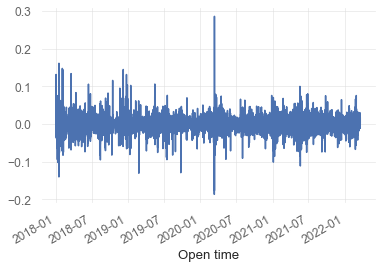

In [123]:
bm_rets_2hr.plot().show()

In [170]:

qs_defaults = dict(
    benchmark_returns=bm_rets_2hr,
    # rf=0.001,
    # frequency=freq,
    annualize=True,    
)
test_qs = bm_rets_2hr.vbt.returns.qs(defaults=qs_defaults)
test_qs.cagr()
test_qs.monthly_returns()

,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,EOY
2018,0.566653,-0.241205,-0.538465,0.702833,-0.138600,-0.214119,-0.048162,-0.348920,-0.172240,-0.146862,-0.427716,0.155808,-0.953633
2019,-0.190262,0.271514,0.044628,0.144646,0.655441,0.092572,-0.253775,-0.214495,0.054089,0.007354,-0.169118,-0.146727,0.297813
2020,0.393543,0.206789,-0.388978,0.552743,0.123690,-0.025781,0.535151,0.252534,-0.170497,0.074007,0.595663,0.194208,2.154286
2021,0.782339,0.081239,0.352450,0.444443,-0.023903,-0.159071,0.112217,0.354853,-0.124983,0.428779,0.080017,-0.206042,2.205872
2022,-0.269104,0.087092,-0.014112,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.160334


In [171]:

import numpy as np
two_hr_stddev = np.std(bm_rets_2hr)
print(two_hr_stddev)
annual_std_dev = two_hr_stddev*np.sqrt(12*365)
print(annual_std_dev)
print(test_qs.volatility())
print(test_qs.sharpe())
print(test_qs.sortino())

0.0153004243612952
1.0126060818918847
1.0126335561795161
0.8317911355846623
1.189863947145494


I can not seem to figure out why all the numbers above seem to be fine and make sense but when i try to run a quantstats basic report I get numbers that are way off. Note the Sharpe ratio below and above

                    Strategy
------------------  ----------
Start Period        2018-01-01
End Period          2022-03-20
Risk-Free Rate      0.0%
Time in Market      100.0%

Cumulative Return   301.09%
CAGR﹪              39.02%

Sharpe              0.2
Sortino             0.29
Sortino/√2          0.2
Omega               1.04

Max Drawdown        -94.14%
Longest DD Days     1101

Gain/Pain Ratio     0.13
Gain/Pain (1M)      0.78

Payoff Ratio        1.0
Profit Factor       1.04
Common Sense Ratio  1.03
CPC Index           0.53
Tail Ratio          0.99
Outlier Win Ratio   4.53
Outlier Loss Ratio  4.55

MTD                 -1.41%
3M                  -27.28%
6M                  -16.18%
YTD                 -21.67%
1Y                  59.18%
3Y (ann.)           174.64%
5Y (ann.)           39.02%
10Y (ann.)          39.02%
All-time (ann.)     39.02%

Avg. Drawdown       -5.63%
Avg. Drawdown Days  16
Recovery Factor     3.2
Ulcer Index         0.68
Serenity Index      0.06


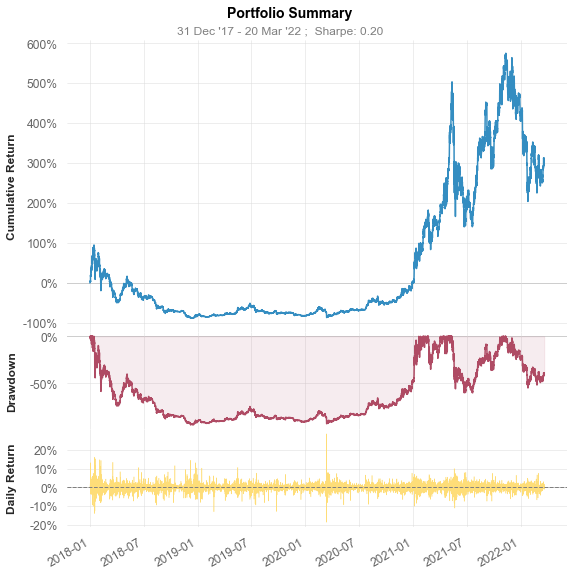

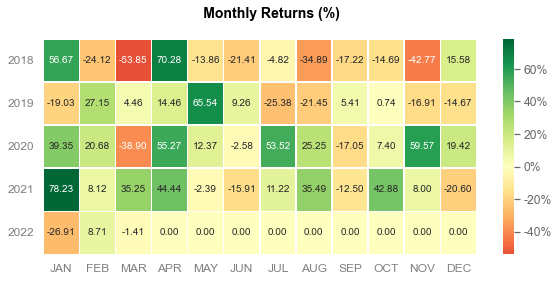

In [172]:
test_qs.basic_report()

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2018-01-01  2018-01-01
End Period                 2022-03-20  2022-03-20
Risk-Free Rate             0.0%        0.0%
Time in Market             34.0%       98.0%

Cumulative Return          994.97%     301.09%
CAGR﹪                     76.41%      39.02%

Sharpe                     0.45        0.2
Smart Sharpe               0.44        0.19
Sortino                    0.77        0.28
Smart Sortino              0.75        0.28
Sortino/√2                 0.54        0.2
Smart Sortino/√2           0.53        0.2
Omega                      1.17        1.17

Max Drawdown               -17.55%     -94.14%
Longest DD Days            133         1101
Volatility (ann.)          7.73%       24.01%
R^2                        0.0         0.0
Calmar                     4.35        0.41
Skew                       3.98        0.32
Kurtosis                   96.31       19.4

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-01-11,2020-02-11,2020-04-02,82,-17.551405,-16.496763
2,2018-05-25,2018-09-05,2018-10-05,133,-17.485638,-16.315098
3,2021-03-10,2021-03-22,2021-04-18,38,-17.167306,-15.922962
4,2020-10-12,2020-11-10,2020-12-08,57,-16.463102,-15.157464
5,2021-10-27,2021-11-01,2021-11-28,32,-16.294850,-15.653147


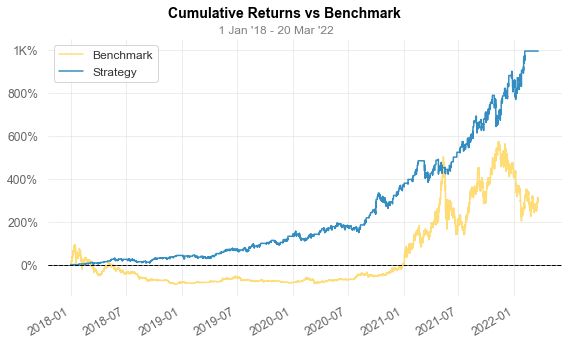

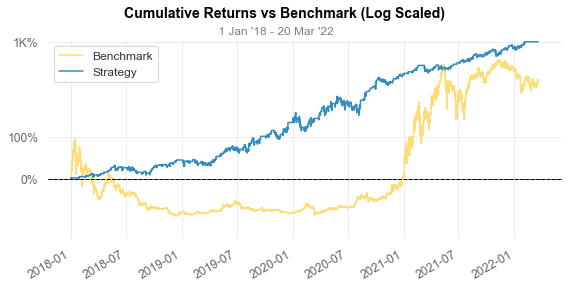

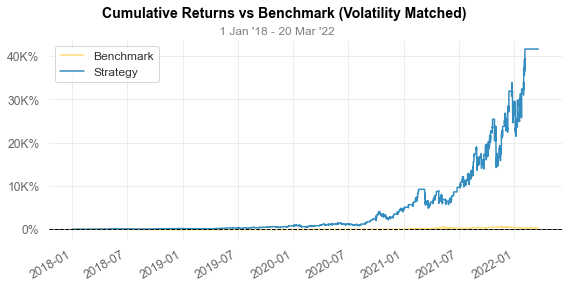

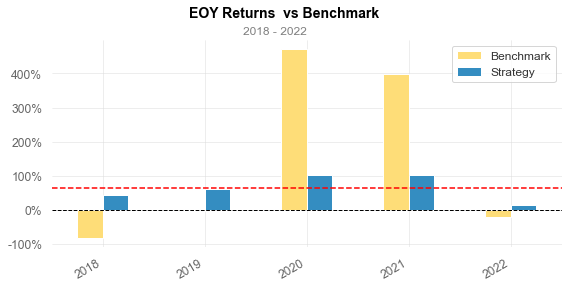

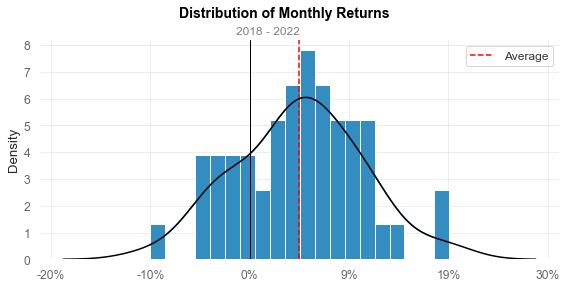

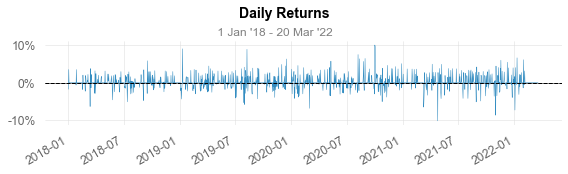

ValueError: Index contains duplicate entries, cannot reshape

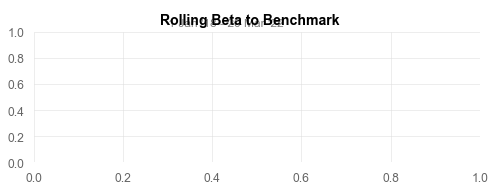

In [174]:
merged_portfolio.get_qs().full_report()

                           Strategy    Benchmark
-------------------------  ----------  -----------
Start Period               2018-01-01  2018-01-01
End Period                 2022-03-20  2022-03-20
Risk-Free Rate             0.0%        0.0%
Time in Market             35.0%       98.0%

Cumulative Return          972.2%      301.09%
CAGR﹪                     75.53%      39.02%

Sharpe                     0.39        0.19
Smart Sharpe               0.34        0.17
Sortino                    0.64        0.28
Smart Sortino              0.56        0.24
Sortino/√2                 0.45        0.2
Smart Sortino/√2           0.39        0.17
Omega                      1.16        1.16

Max Drawdown               -20.3%      -94.14%
Longest DD Days            133         1101
Volatility (ann.)          8.82%       23.95%
R^2                        0.0         0.0
Calmar                     3.72        0.41
Skew                       3.47        0.3
Kurtosis                   127.37      18.

None

,Start,Valley,End,Days,Max Drawdown,99% Max Drawdown
1,2020-10-12,2020-11-18,2020-12-16,65,-20.295354,-16.342819
2,2021-03-10,2021-03-22,2021-04-18,38,-18.597427,-16.670987
3,2020-01-11,2020-02-11,2020-04-02,82,-17.633221,-16.644266
4,2018-05-25,2018-09-05,2018-10-05,133,-17.485638,-16.436340
5,2021-10-20,2021-11-01,2021-11-29,39,-16.763040,-16.052608


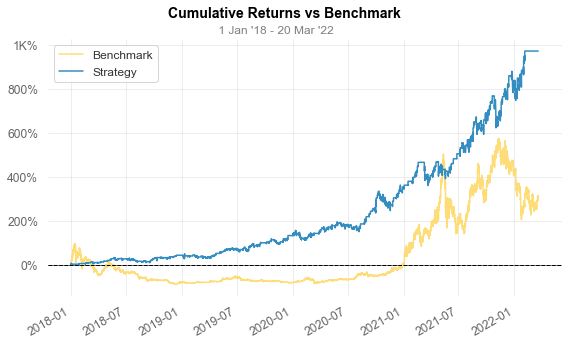

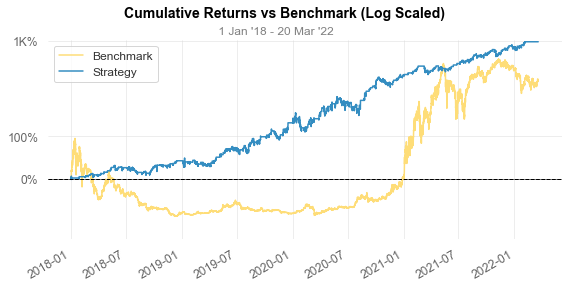

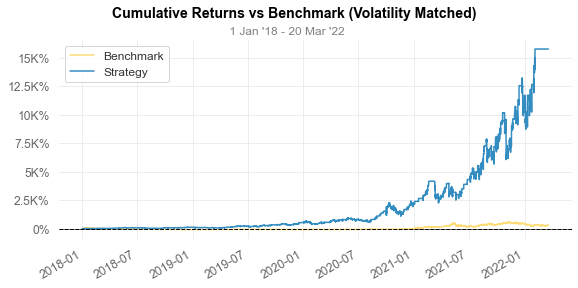

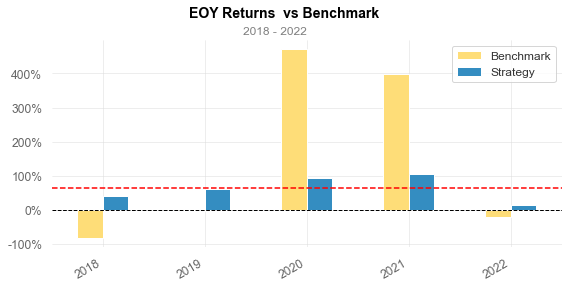

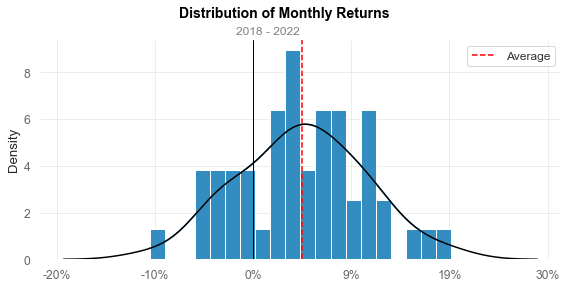

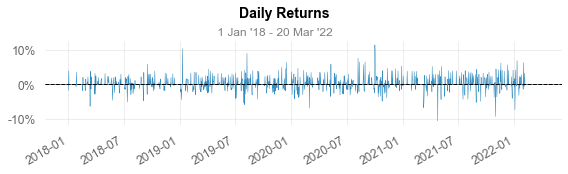

ValueError: Index contains duplicate entries, cannot reshape

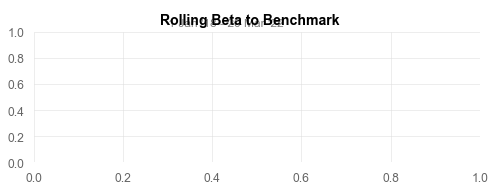

In [177]:
concatenated_portfolio.get_qs().full_report()